In [1]:
from pathlib import Path
import sys
# Use absolute or relative path to the folder containing your .py file
sys.path.append("/Users/andressiin/SaveTheKnees/Aux_functions/")

from dicom_utils3 import iter_patient_studies, get_study_series_summary, select_middle_series, show_middle_sequence, sequence_to_array,\
    load_series, show_grid, iter_patient_studies, get_study_series_summary, select_middle_series, middle_slice_to_array, show_middle_slice


In [2]:
from dicom_utils3 import collect_middle_sequences

results = collect_middle_sequences("/Users/andressiin/savetheknees_mri_images")

for patient_id, studies in results.items():
    print(f"Patient {patient_id}:")
    for study_id, middle in studies.items():
        print(f"  {study_id}: view={middle['view']}, n_slices={middle['n_slices']}")

Patient 1.2.826.0.1.3680043.8.498.10004873229099053869093324292195817260:
  1.2.826.0.1.3680043.8.498.12343110195036213483454091715412333772: view=Sagittal, n_slices=22
  1.2.826.0.1.3680043.8.498.13821229744997220641575291927426543265: view=Axial, n_slices=18
  1.2.826.0.1.3680043.8.498.23084836536722595275828690293168736174: view=Coronal, n_slices=16
  1.2.826.0.1.3680043.8.498.40734206102458723096154687147390476697: view=Coronal, n_slices=16
  1.2.826.0.1.3680043.8.498.75714899997203615784077798038670363546: view=Sagittal, n_slices=22
Patient 1.2.826.0.1.3680043.8.498.10004945927472656027199792075652399585:
  1.2.826.0.1.3680043.8.498.27845969797953115400959653384511165237: view=Sagittal, n_slices=34
  1.2.826.0.1.3680043.8.498.72137122913943091996840828871969421711: view=Sagittal, n_slices=34
  1.2.826.0.1.3680043.8.498.83327574802189551711953505990029424266: view=Axial, n_slices=38
  1.2.826.0.1.3680043.8.498.87374594163896635184044513927478147680: view=Coronal, n_slices=30
  1.2.

In [3]:
training_arrays = {}

for patient_id, study_id, study_dir in iter_patient_studies("/path/to/patients"):
    summaries = get_study_series_summary(study_dir)
    middle_series = select_middle_series(summaries)
    if middle_series is None:
        continue

    show_middle_slice(middle_series)                                    # the ONE image
    arr = middle_slice_to_array(middle_series["datasets"], img_size=224)  # (H, W) array

    training_arrays[(patient_id, study_id)] = arr

all_arrays = np.stack(list(training_arrays.values()), axis=0)  # (num_studies, H, W)

FileNotFoundError: [Errno 2] No such file or directory: '/path/to/patients'

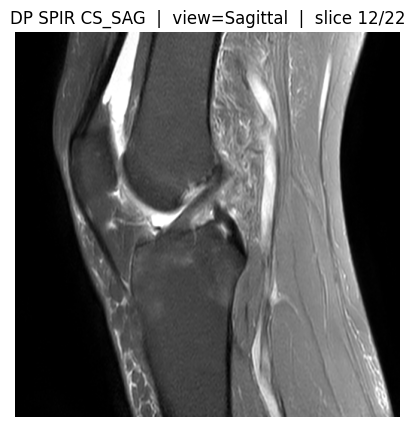

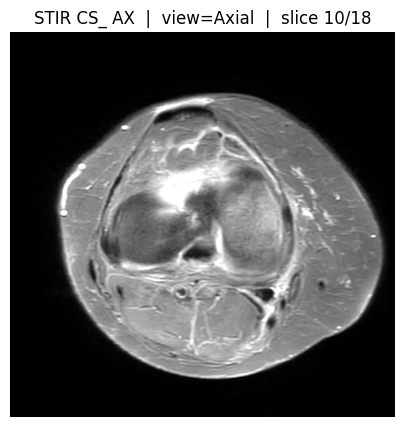

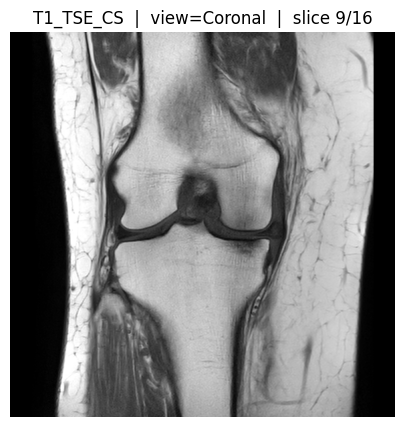

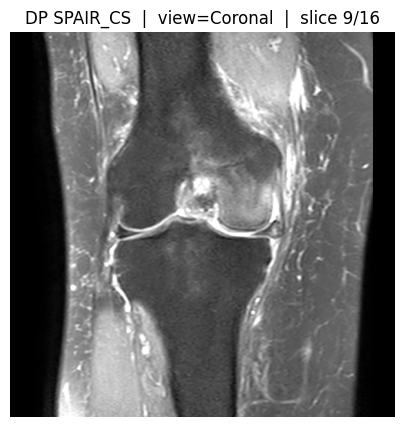

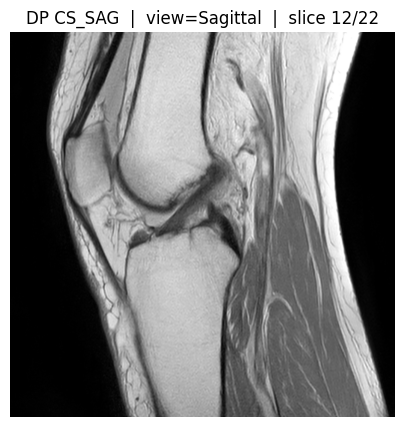

...

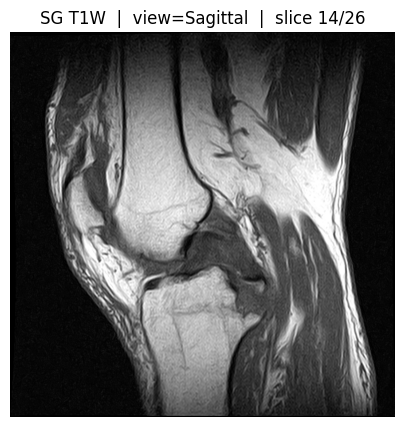

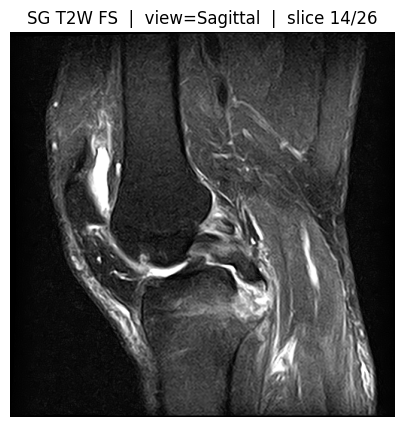

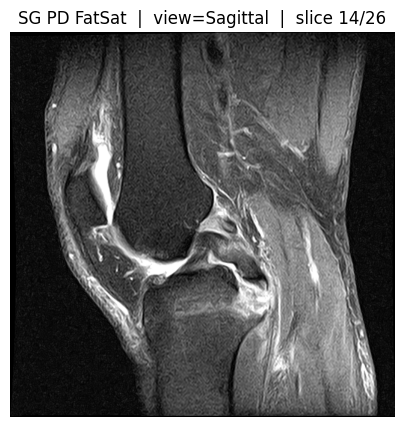

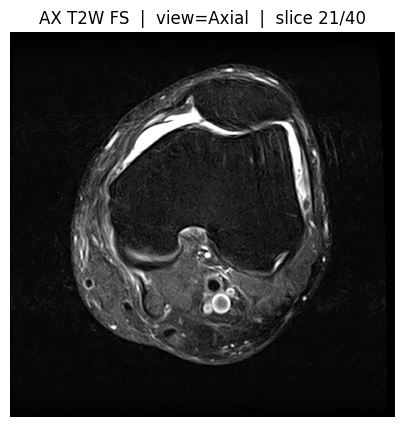

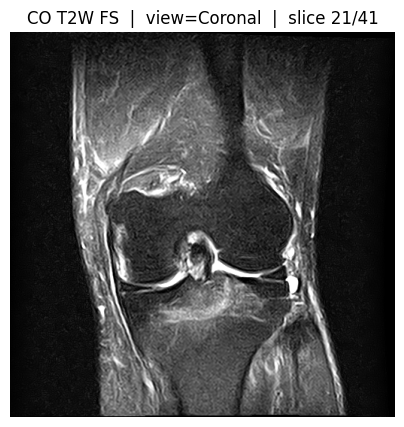

NameError: name 'np' is not defined

In [4]:
training_arrays = {}

for patient_id, study_id, study_dir in iter_patient_studies("/Users/andressiin/savetheknees_mri_images"):
    summaries = get_study_series_summary(study_dir)
    middle_series = select_middle_series(summaries)
    if middle_series is None:
        continue

    show_middle_slice(middle_series)                                    # the ONE image
    arr = middle_slice_to_array(middle_series["datasets"], img_size=224)  # (H, W) array

    training_arrays[(patient_id, study_id)] = arr

all_arrays = np.stack(list(training_arrays.values()), axis=0)  # (num_studies, H, W)

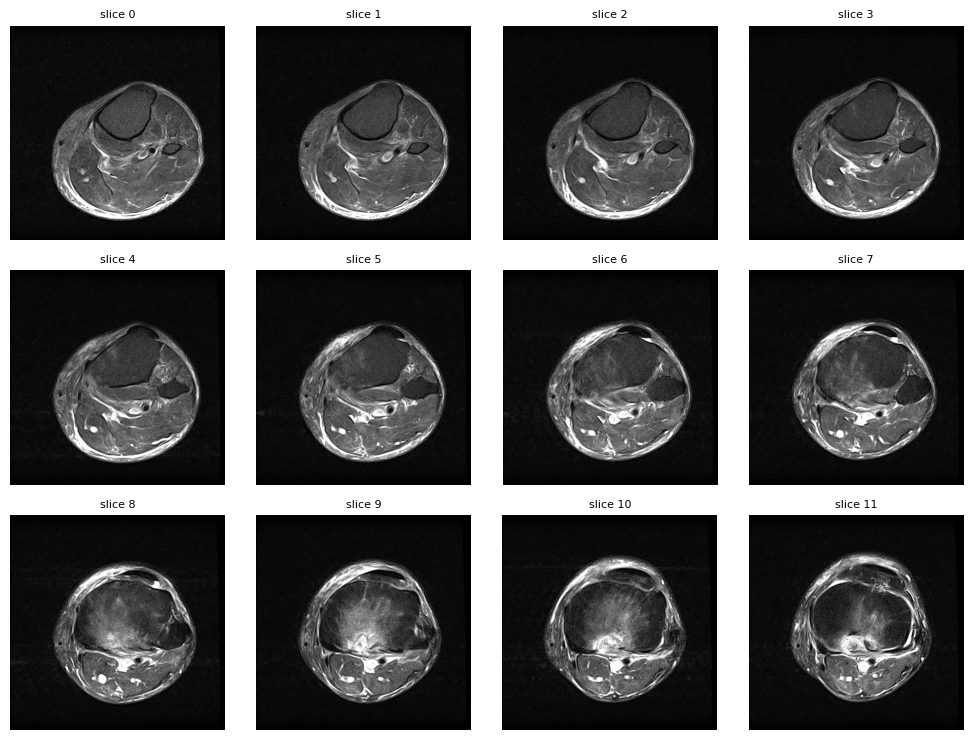

In [5]:
datasets = load_series("/Users/andressiin/savetheknees_mri_images/1.2.826.0.1.3680043.8.498.10025765742726180988537955593315007559/1.2.826.0.1.3680043.8.498.52503045794545563216216974185473269584")
#volume = series_to_volume(datasets)   # (num_slices, H, W)
show_grid(datasets)